<a href="https://colab.research.google.com/github/mobarakol/DARES_MedICSS2024/blob/main/AF_SFMLearner_Demo.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Connecting with google drive

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

In [23]:
%cd ..
!rm -rf AF-SfMLearner

/content


Download Code from the updated repo (corner=true)

In [24]:
!git clone https://github.com/mobarakol/AF-SfMLearner.git
%cd AF-SfMLearner

!gdown 1trvLsQvXpsILHTZPR-FU5z6Au4YZLwRP
!mv gt_depths.npz /content/AF-SfMLearner/splits/endovis

Cloning into 'AF-SfMLearner'...
remote: Enumerating objects: 281, done.
remote: Counting objects: 100% (98/98), done.
remote: Compressing objects: 100% (89/89), done.
remote: Total 281 (delta 49), reused 23 (delta 9), pack-reused 183
Receiving objects: 100% (281/281), 4.84 MiB | 16.53 MiB/s, done.
Resolving deltas: 100% (123/123), done.
/content/AF-SfMLearner
Downloading...
From (original): https://drive.google.com/uc?id=1trvLsQvXpsILHTZPR-FU5z6Au4YZLwRP
From (redirected): https://drive.google.com/uc?id=1trvLsQvXpsILHTZPR-FU5z6Au4YZLwRP&confirm=t&uuid=708204f6-1acd-4f02-9553-2447bbbd9360
To: /content/AF-SfMLearner/gt_depths.npz
100% 811M/811M [00:17<00:00, 46.9MB/s]


In [25]:
!python evaluate_depth.py --data_path /content/drive/MyDrive/DARES/SCARED_Images_Resized --max_depth 150.0 --eval_mono --load_weights_folder /content/drive/MyDrive/DARES/af_sfmlearner_weights_media

-> Loading weights from /content/drive/MyDrive/DARES/af_sfmlearner_weights_media
-> Computing predictions with size 320x256
-> Evaluating
   Mono evaluation - using median scaling
 Scaling ratios | med: 152.231 | std: 0.323

   abs_rel |   sq_rel |     rmse | rmse_log |       a1 |       a2 |       a3 | 
&   0.060  &   0.477  &   5.100  &   0.083  &   0.966  &   0.997  &   1.000  \\

-> Done!


Pose for SCARED Seq 1:

In [38]:
!python evaluate_pose.py --data_path /content/drive/MyDrive/DARES/SCARED_Images_Resized --load_weights_folder /content/drive/MyDrive/DARES/af_sfmlearner_weights_media --scared_pose_seq 1

-> Computing pose predictions

   Trajectory error: 0.0757, std: 0.0544


   Rotation error: 0.0031, std: 0.0019



Pose for SCARED Seq 2:

In [36]:
|!python evaluate_pose.py --data_path /content/drive/MyDrive/DARES/SCARED_Images_Resized --load_weights_folder /content/drive/MyDrive/DARES/af_sfmlearner_weights_media --scared_pose_seq 2

-> Computing pose predictions

   Trajectory error: 0.0501, std: 0.0281


   Rotation error: 0.0034, std: 0.0022



In [48]:
!python visualize_pose.py --scared_pose_seq 1

Figure(640x480)


In [49]:
!python visualize_pose.py --scared_pose_seq 2

Figure(640x480)


(<Figure size 640x480 with 1 Axes>,
 (0.0, 1.0, 0.0, 1.0),
 <matplotlib.image.AxesImage at 0x79f1c4eaece0>)

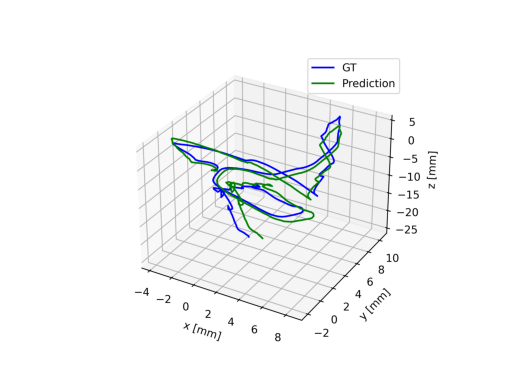

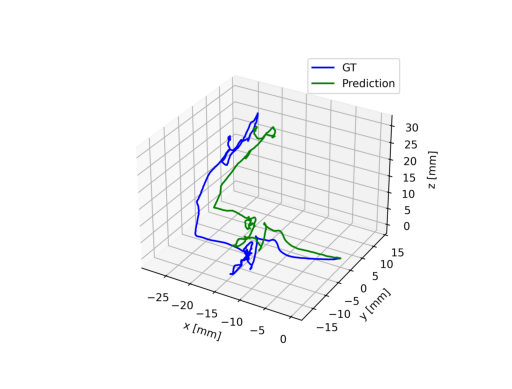

In [53]:
import matplotlib.pyplot as plt
from PIL import Image
tr1 = Image.open('/content/AF-SfMLearner/trajectory_pose_seq1.png')
plt.figure(121), plt.axis('OFF'),plt.imshow(tr1)

tr1 = Image.open('/content/AF-SfMLearner/trajectory_pose_seq2.png')
plt.figure(122), plt.axis('OFF'),plt.imshow(tr1)

In [55]:
!pip -q install open3d

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 399.7/399.7 MB 1.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.5/7.5 MB 42.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 139.4/139.4 kB 14.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.3/2.3 MB 7.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 27.9 MB/s eta 0:00:00


In [57]:
!python evaluate_3d_reconstruction.py --data_path /content/drive/MyDrive/DARES/SCARED_Images_Resized --eval_mono --load_weights_folder /content/drive/MyDrive/DARES/af_sfmlearner_weights_media --visualize_depth --save_recon

-> Loading weights from /content/drive/MyDrive/DARES/af_sfmlearner_weights_media
/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:558: UserWarning: This DataLoader will create 12 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:135: UserWarning: Using 'weights' as positional parameter(s) is deprecated since 0.13 and may be removed in the future. Please use keyword parameter(s) instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in th

In [58]:
import open3d as o3d
import numpy as np
import plotly.graph_objects as go

print("Load a ply point cloud, print it, and render it")
ply_point_cloud = o3d.data.PLYPointCloud()
pcd = o3d.io.read_point_cloud('/content/AF-SfMLearner/splits/endovis/reconstruction/1_1_000001.ply')
points = np.asarray(pcd.points)
# print(pcd)
# print(np.asarray(pcd.points))

colors = None
if pcd.has_colors():
    colors = np.asarray(pcd.colors)
elif pcd.has_normals():
    colors = (0.5, 0.5, 0.5) + np.asarray(pcd.normals) * 0.5


fig = go.Figure(
  data=[
    go.Scatter3d(
      x=points[:,0], y=points[:,1], z=points[:,2],
      mode='markers',
      marker=dict(size=1, color=colors)
)
],
  layout=dict(
    scene=dict(
      xaxis=dict(visible=False),
      yaxis=dict(visible=False),
      zaxis=dict(visible=False)
)
)
)
fig.show()

Load a ply point cloud, print it, and render it
[Open3D INFO] Downloading https://github.com/isl-org/open3d_downloads/releases/download/20220201-data/fragment.ply
[Open3D INFO] Downloaded to /root/open3d_data/download/PLYPointCloud/fragment.ply
PointCloud with 81920 points.
[[-0.03245287 -0.02608956  0.0532227 ]
 [-0.03215538 -0.02601298  0.05306648]
 [-0.03172809 -0.02582977  0.05269272]
 ...
 [ 0.02897878  0.02355634  0.04843333]
 [ 0.02910744  0.02351117  0.04834045]
 [ 0.02986444  0.02397091  0.04928571]]
